# 1) Importing the required libraries

In [80]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# 2) Loading the Dataset

In [83]:
df = pd.read_csv(r'C:\Users\akula\OneDrive\Desktop\data science internship Code clause\Customer lifetime value prediction\ecommerce_customer_data_custom_ratios.csv')


print(df.head())


   Customer ID        Purchase Date Product Category  Product Price  Quantity  \
0        46251  2020-09-08 09:38:32      Electronics             12         3   
1        46251  2022-03-05 12:56:35             Home            468         4   
2        46251  2022-05-23 18:18:01             Home            288         2   
3        46251  2020-11-12 13:13:29         Clothing            196         1   
4        13593  2020-11-27 17:55:11             Home            449         1   

   Total Purchase Amount Payment Method  Customer Age  Returns  \
0                    740    Credit Card            37      0.0   
1                   2739         PayPal            37      0.0   
2                   3196         PayPal            37      0.0   
3                   3509         PayPal            37      0.0   
4                   3452    Credit Card            49      0.0   

         Customer Name  Age  Gender  Churn  
0  Christine Hernandez   37    Male      0  
1  Christine Hernandez   3

In [84]:
for index,row in df.iterrows():
    print(f'Row{index} : {row.to_dict()}')

Row0 : {'Customer ID': 46251, 'Purchase Date': '2020-09-08 09:38:32', 'Product Category': 'Electronics', 'Product Price': 12, 'Quantity': 3, 'Total Purchase Amount': 740, 'Payment Method': 'Credit Card', 'Customer Age': 37, 'Returns': 0.0, 'Customer Name': 'Christine Hernandez', 'Age': 37, 'Gender': 'Male', 'Churn': 0}
Row1 : {'Customer ID': 46251, 'Purchase Date': '2022-03-05 12:56:35', 'Product Category': 'Home', 'Product Price': 468, 'Quantity': 4, 'Total Purchase Amount': 2739, 'Payment Method': 'PayPal', 'Customer Age': 37, 'Returns': 0.0, 'Customer Name': 'Christine Hernandez', 'Age': 37, 'Gender': 'Male', 'Churn': 0}
Row2 : {'Customer ID': 46251, 'Purchase Date': '2022-05-23 18:18:01', 'Product Category': 'Home', 'Product Price': 288, 'Quantity': 2, 'Total Purchase Amount': 3196, 'Payment Method': 'PayPal', 'Customer Age': 37, 'Returns': 0.0, 'Customer Name': 'Christine Hernandez', 'Age': 37, 'Gender': 'Male', 'Churn': 0}
Row3 : {'Customer ID': 46251, 'Purchase Date': '2020-11-1

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Row38638 : {'Customer ID': 1119, 'Purchase Date': '2022-02-26 04:44:12', 'Product Category': 'Home', 'Product Price': 33, 'Quantity': 4, 'Total Purchase Amount': 2213, 'Payment Method': 'PayPal', 'Customer Age': 29, 'Returns': 1.0, 'Customer Name': 'Kaitlyn Carter', 'Age': 29, 'Gender': 'Female', 'Churn': 0}
Row38639 : {'Customer ID': 1119, 'Purchase Date': '2022-05-08 18:42:59', 'Product Category': 'Electronics', 'Product Price': 169, 'Quantity': 4, 'Total Purchase Amount': 3997, 'Payment Method': 'PayPal', 'Customer Age': 29, 'Returns': 0.0, 'Customer Name': 'Kaitlyn Carter', 'Age': 29, 'Gender': 'Female', 'Churn': 0}
Row38640 : {'Customer ID': 1119, 'Purchase Date': '2022-01-08 19:42:44', 'Product Category': 'Books', 'Product Price': 290, 'Quantity': 2, 'Total Purchase Amount': 2243, 'Payment Method': 'PayPal', 'Customer Age': 29, 'Returns': nan, 'Customer Name': 'Kaitlyn Carter', 'Age': 29, 'Gender': 'Female', 'Churn': 0}
Row38641 : {'Customer ID': 1119, 'Purchase Date': '2020-06-0

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Row76964 : {'Customer ID': 26925, 'Purchase Date': '2022-07-24 21:15:47', 'Product Category': 'Clothing', 'Product Price': 264, 'Quantity': 4, 'Total Purchase Amount': 4714, 'Payment Method': 'Credit Card', 'Customer Age': 25, 'Returns': 0.0, 'Customer Name': 'Erica Lowe', 'Age': 25, 'Gender': 'Female', 'Churn': 0}
Row76965 : {'Customer ID': 26925, 'Purchase Date': '2022-01-04 10:04:45', 'Product Category': 'Electronics', 'Product Price': 104, 'Quantity': 4, 'Total Purchase Amount': 3754, 'Payment Method': 'Credit Card', 'Customer Age': 25, 'Returns': 0.0, 'Customer Name': 'Erica Lowe', 'Age': 25, 'Gender': 'Female', 'Churn': 0}
Row76966 : {'Customer ID': 26925, 'Purchase Date': '2021-07-01 16:37:07', 'Product Category': 'Clothing', 'Product Price': 424, 'Quantity': 5, 'Total Purchase Amount': 1526, 'Payment Method': 'Credit Card', 'Customer Age': 25, 'Returns': nan, 'Customer Name': 'Erica Lowe', 'Age': 25, 'Gender': 'Female', 'Churn': 0}
Row76967 : {'Customer ID': 26925, 'Purchase Da

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Row114511 : {'Customer ID': 11940, 'Purchase Date': '2022-06-06 13:41:55', 'Product Category': 'Clothing', 'Product Price': 421, 'Quantity': 3, 'Total Purchase Amount': 2478, 'Payment Method': 'Cash', 'Customer Age': 25, 'Returns': 1.0, 'Customer Name': 'Beverly Schroeder', 'Age': 25, 'Gender': 'Male', 'Churn': 0}
Row114512 : {'Customer ID': 11940, 'Purchase Date': '2021-11-29 06:13:10', 'Product Category': 'Books', 'Product Price': 67, 'Quantity': 2, 'Total Purchase Amount': 4004, 'Payment Method': 'PayPal', 'Customer Age': 25, 'Returns': 0.0, 'Customer Name': 'Beverly Schroeder', 'Age': 25, 'Gender': 'Male', 'Churn': 0}
Row114513 : {'Customer ID': 18511, 'Purchase Date': '2023-06-30 23:43:15', 'Product Category': 'Clothing', 'Product Price': 410, 'Quantity': 1, 'Total Purchase Amount': 2945, 'Payment Method': 'Credit Card', 'Customer Age': 54, 'Returns': 0.0, 'Customer Name': 'John Smith', 'Age': 54, 'Gender': 'Male', 'Churn': 0}
Row114514 : {'Customer ID': 18511, 'Purchase Date': '2

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Row151623 : {'Customer ID': 31111, 'Purchase Date': '2020-05-06 00:32:25', 'Product Category': 'Electronics', 'Product Price': 149, 'Quantity': 4, 'Total Purchase Amount': 3596, 'Payment Method': 'PayPal', 'Customer Age': 27, 'Returns': 1.0, 'Customer Name': 'Jorge Huerta', 'Age': 27, 'Gender': 'Female', 'Churn': 0}
Row151624 : {'Customer ID': 31111, 'Purchase Date': '2021-02-03 14:52:24', 'Product Category': 'Electronics', 'Product Price': 38, 'Quantity': 4, 'Total Purchase Amount': 1440, 'Payment Method': 'Cash', 'Customer Age': 27, 'Returns': 1.0, 'Customer Name': 'Jorge Huerta', 'Age': 27, 'Gender': 'Female', 'Churn': 0}
Row151625 : {'Customer ID': 31111, 'Purchase Date': '2020-09-17 21:48:32', 'Product Category': 'Electronics', 'Product Price': 45, 'Quantity': 5, 'Total Purchase Amount': 2865, 'Payment Method': 'Credit Card', 'Customer Age': 27, 'Returns': nan, 'Customer Name': 'Jorge Huerta', 'Age': 27, 'Gender': 'Female', 'Churn': 0}
Row151626 : {'Customer ID': 44729, 'Purchase 

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Row158313 : {'Customer ID': 34260, 'Purchase Date': '2021-04-26 10:51:42', 'Product Category': 'Clothing', 'Product Price': 421, 'Quantity': 3, 'Total Purchase Amount': 1251, 'Payment Method': 'Credit Card', 'Customer Age': 32, 'Returns': 0.0, 'Customer Name': 'Courtney Taylor', 'Age': 32, 'Gender': 'Male', 'Churn': 0}
Row158314 : {'Customer ID': 47441, 'Purchase Date': '2020-06-08 22:54:21', 'Product Category': 'Clothing', 'Product Price': 210, 'Quantity': 3, 'Total Purchase Amount': 1776, 'Payment Method': 'Credit Card', 'Customer Age': 56, 'Returns': 0.0, 'Customer Name': 'Kristen Ward', 'Age': 56, 'Gender': 'Female', 'Churn': 0}
Row158315 : {'Customer ID': 47441, 'Purchase Date': '2022-06-22 18:40:37', 'Product Category': 'Home', 'Product Price': 383, 'Quantity': 3, 'Total Purchase Amount': 1840, 'Payment Method': 'Cash', 'Customer Age': 56, 'Returns': 0.0, 'Customer Name': 'Kristen Ward', 'Age': 56, 'Gender': 'Female', 'Churn': 0}
Row158316 : {'Customer ID': 47441, 'Purchase Date'

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Row188360 : {'Customer ID': 42502, 'Purchase Date': '2021-10-21 16:50:01', 'Product Category': 'Books', 'Product Price': 340, 'Quantity': 5, 'Total Purchase Amount': 3218, 'Payment Method': 'Cash', 'Customer Age': 25, 'Returns': 1.0, 'Customer Name': 'Victoria Hernandez', 'Age': 25, 'Gender': 'Male', 'Churn': 0}
Row188361 : {'Customer ID': 42502, 'Purchase Date': '2023-06-28 09:33:47', 'Product Category': 'Books', 'Product Price': 391, 'Quantity': 1, 'Total Purchase Amount': 2378, 'Payment Method': 'PayPal', 'Customer Age': 25, 'Returns': 1.0, 'Customer Name': 'Victoria Hernandez', 'Age': 25, 'Gender': 'Male', 'Churn': 0}
Row188362 : {'Customer ID': 42502, 'Purchase Date': '2021-07-25 16:10:14', 'Product Category': 'Electronics', 'Product Price': 452, 'Quantity': 2, 'Total Purchase Amount': 3963, 'Payment Method': 'PayPal', 'Customer Age': 25, 'Returns': 0.0, 'Customer Name': 'Victoria Hernandez', 'Age': 25, 'Gender': 'Male', 'Churn': 0}
Row188363 : {'Customer ID': 37997, 'Purchase Dat

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Row225972 : {'Customer ID': 2873, 'Purchase Date': '2023-05-17 01:55:00', 'Product Category': 'Electronics', 'Product Price': 97, 'Quantity': 1, 'Total Purchase Amount': 416, 'Payment Method': 'Credit Card', 'Customer Age': 26, 'Returns': 0.0, 'Customer Name': 'John Huffman', 'Age': 26, 'Gender': 'Female', 'Churn': 0}
Row225973 : {'Customer ID': 2873, 'Purchase Date': '2022-04-17 06:00:03', 'Product Category': 'Clothing', 'Product Price': 361, 'Quantity': 5, 'Total Purchase Amount': 3844, 'Payment Method': 'PayPal', 'Customer Age': 26, 'Returns': 0.0, 'Customer Name': 'John Huffman', 'Age': 26, 'Gender': 'Female', 'Churn': 0}
Row225974 : {'Customer ID': 2873, 'Purchase Date': '2022-12-24 23:43:17', 'Product Category': 'Home', 'Product Price': 478, 'Quantity': 2, 'Total Purchase Amount': 4441, 'Payment Method': 'Cash', 'Customer Age': 26, 'Returns': nan, 'Customer Name': 'John Huffman', 'Age': 26, 'Gender': 'Female', 'Churn': 0}
Row225975 : {'Customer ID': 2873, 'Purchase Date': '2020-1

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



# 3) Data Preprocessing

# 1) Check for missing values

In [88]:
# Check missing values
missing_values = df.isnull().sum()
print("\nMissing Values in Each Column:\n", missing_values)

# Handle missing values (drop rows with missing data)
df = df.dropna()
print("\nData after dropping missing values:")
print(df.info())




Missing Values in Each Column:
 Customer ID                  0
Purchase Date                0
Product Category             0
Product Price                0
Quantity                     0
Total Purchase Amount        0
Payment Method               0
Customer Age                 0
Returns                  47596
Customer Name                0
Age                          0
Gender                       0
Churn                        0
dtype: int64

Data after dropping missing values:
<class 'pandas.core.frame.DataFrame'>
Index: 202404 entries, 0 to 249999
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Customer ID            202404 non-null  int64  
 1   Purchase Date          202404 non-null  object 
 2   Product Category       202404 non-null  object 
 3   Product Price          202404 non-null  int64  
 4   Quantity               202404 non-null  int64  
 5   Total Purchase Amount  202404 no

# 2) Conversion of Date Columns

In [90]:
# Convert 'Purchase Date' to datetime
df['Purchase Date'] = pd.to_datetime(df['Purchase Date'])

# Verify the conversion
print("\nData Types after Conversion:\n", df.dtypes)




Data Types after Conversion:
 Customer ID                       int64
Purchase Date            datetime64[ns]
Product Category                 object
Product Price                     int64
Quantity                          int64
Total Purchase Amount             int64
Payment Method                   object
Customer Age                      int64
Returns                         float64
Customer Name                    object
Age                               int64
Gender                           object
Churn                             int64
dtype: object


# 3) Outlier Detection and Handling

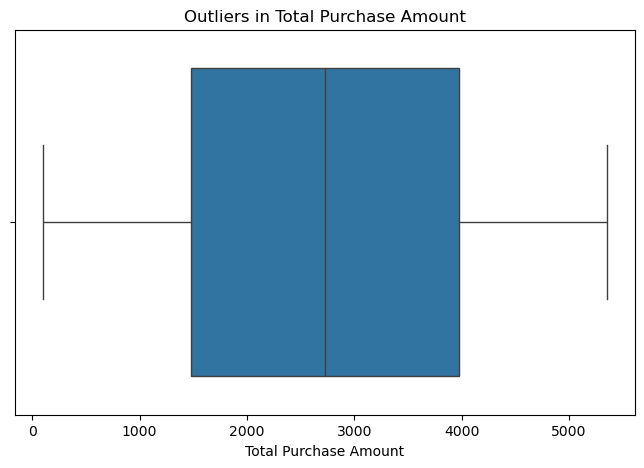

In [92]:
# Plot boxplot to detect outliers for Total Purchase Amount
plt.figure(figsize=(8, 5))
sns.boxplot(x=df['Total Purchase Amount'])
plt.title("Outliers in Total Purchase Amount")
plt.show()

In [93]:
# removing the outliers using IQR method
# Calculate IQR
Q1 = df['Total Purchase Amount'].quantile(0.25)
Q3 = df['Total Purchase Amount'].quantile(0.75)
IQR = Q3 - Q1

# Filter out outliers
df = df[(df['Total Purchase Amount'] >= Q1 - 1.5 * IQR) & (df['Total Purchase Amount'] <= Q3 + 1.5 * IQR)]

print("\nData after Outlier Removal:\n", df.describe())



Data after Outlier Removal:
          Customer ID                  Purchase Date  Product Price  \
count  202404.000000                         202404  202404.000000   
mean    25013.981962  2021-11-07 01:49:42.200015360     254.377423   
min         1.000000            2020-01-01 00:15:00      10.000000   
25%     12546.750000  2020-12-02 22:21:40.750000128     132.000000   
50%     25018.500000            2021-11-06 04:57:48     254.000000   
75%     37511.000000  2022-10-11 05:45:47.249999872     377.000000   
max     50000.000000            2023-09-15 12:24:08     500.000000   
std     14412.553209                            NaN     141.565500   

            Quantity  Total Purchase Amount   Customer Age        Returns  \
count  202404.000000          202404.000000  202404.000000  202404.000000   
mean        2.999269            2725.130813      43.926498       0.497861   
min         1.000000             101.000000      18.000000       0.000000   
25%         2.000000           

# 4) Feature Engineering

In [95]:
#Recency calculation like days since the last purchase
latest_date = df['Purchase Date'].max()
df['Recency'] = (latest_date - df['Purchase Date']).dt.days

print("\nSample Recency Values:\n", df[['Customer ID', 'Recency']].head())



Sample Recency Values:
    Customer ID  Recency
0        46251     1102
1        46251      558
2        46251      479
3        46251     1036
4        13593     1021


In [96]:
# frequency calculation like number of purchases per customer
df['Frequency'] = df.groupby('Customer ID')['Purchase Date'].transform('count')

print("\nSample Frequency Values:\n", df[['Customer ID', 'Frequency']].head())



Sample Frequency Values:
    Customer ID  Frequency
0        46251          4
1        46251          4
2        46251          4
3        46251          4
4        13593          5


In [97]:
# calculates total spending per customer
df['Monetary'] = df.groupby('Customer ID')['Total Purchase Amount'].transform('sum')

print("\nSample Monetary Values:\n", df[['Customer ID', 'Monetary']].head())



Sample Monetary Values:
    Customer ID  Monetary
0        46251     10184
1        46251     10184
2        46251     10184
3        46251     10184
4        13593     12223


In [98]:
print("\nCleaned Dataset Preview:\n", df.head())
print("\nFinal Dataset Info:")
df.info()



Cleaned Dataset Preview:
    Customer ID       Purchase Date Product Category  Product Price  Quantity  \
0        46251 2020-09-08 09:38:32      Electronics             12         3   
1        46251 2022-03-05 12:56:35             Home            468         4   
2        46251 2022-05-23 18:18:01             Home            288         2   
3        46251 2020-11-12 13:13:29         Clothing            196         1   
4        13593 2020-11-27 17:55:11             Home            449         1   

   Total Purchase Amount Payment Method  Customer Age  Returns  \
0                    740    Credit Card            37      0.0   
1                   2739         PayPal            37      0.0   
2                   3196         PayPal            37      0.0   
3                   3509         PayPal            37      0.0   
4                   3452    Credit Card            49      0.0   

         Customer Name  Age  Gender  Churn  Recency  Frequency  Monetary  
0  Christine Hernand

# 4) Splitting the Data into Training and Testing Sets

In [132]:
#chosing the important features 
X = df[['Recency', 'Frequency', 'Customer Age', 'Quantity']]
y = df['Monetary']  # Target: Customer Lifetime Value
# Split data: 80% training, 20% testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"Training set size: {X_train.shape[0]} samples")
print(f"Testing set size: {X_test.shape[0]} samples")

Training set size: 161923 samples
Testing set size: 40481 samples


# 5) Training the Ridge regression model and Evaluating the model performance

In [135]:


from sklearn.linear_model import Ridge

# Initialize the Ridge regression model with a regularization parameter
model = Ridge(alpha=1.0)

cv_scores = cross_val_score(model, X_train, y_train, cv=5)  # 5-fold cross-validation
print(f"Cross-Validation Scores: {cv_scores}")
print(f"Mean CV Score: {np.mean(cv_scores):.2f}")

model.fit(X_train, y_train)
print("Model Coefficients:", model.coef_)
print("Model Intercept:", model.intercept_)

Cross-Validation Scores: [0.74205486 0.74732247 0.74841059 0.74720264 0.74477946]
Mean CV Score: 0.75
Model Coefficients: [-3.13922498e-02  2.73570938e+03  2.42874589e+01  4.17818830e+00]
Model Intercept: -1108.241485399396


# 6) Making Predictions

In [138]:
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Evaluate the model using RMSE and R^2
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
print(f"Training RMSE: {train_rmse:.2f}, Training R^2: {train_r2:.2f}")
print(f"Testing RMSE: {test_rmse:.2f}, Testing R^2: {test_r2:.2f}")

print("Sample Predictions:", y_pred[:5])

Training RMSE: 3238.57, Training R^2: 0.75
Testing RMSE: 3238.49, Testing R^2: 0.74
Sample Predictions: [13449. 25462. 23366. 10341.  7275.]


In [39]:
# making the predictions for the whole dataset
for i, prediction in enumerate(y_pred):
    print(f"Row {i+1}: {prediction}")

Row 1: 13448.999999999996
Row 2: 25462.000000000004
Row 3: 23366.0
Row 4: 10340.999999999998
Row 5: 7275.000000000001
Row 6: 8134.999999999999
Row 7: 14035.000000000002
Row 8: 3285.999999999997
Row 9: 8324.999999999998
Row 10: 10370.0
Row 11: 8199.999999999995
Row 12: 18692.000000000004
Row 13: 19612.0
Row 14: 12005.0
Row 15: 38241.0
Row 16: 10149.999999999996
Row 17: 17396.000000000004
Row 18: 23651.000000000004
Row 19: 20695.999999999996
Row 20: 16014.0
Row 21: 15966.0
Row 22: 15656.000000000002
Row 23: 11306.0
Row 24: 20102.000000000004
Row 25: 15746.000000000002
Row 26: 13648.999999999998
Row 27: 12924.000000000002
Row 28: 11810.999999999998
Row 29: 1436.9999999999986
Row 30: 15555.0
Row 31: 17575.0
Row 32: 12143.999999999998
Row 33: 9796.999999999998
Row 34: 9238.999999999996
Row 35: 18139.0
Row 36: 24918.000000000004
Row 37: 1669.9999999999964
Row 38: 6402.999999999996
Row 39: 11232.999999999996
Row 40: 2458.999999999995
Row 41: 12854.0
Row 42: 14622.000000000004
Row 43: 13949.0


# 9) Evaluating Results

Text(0.5, 0, 'Actual Monetary')

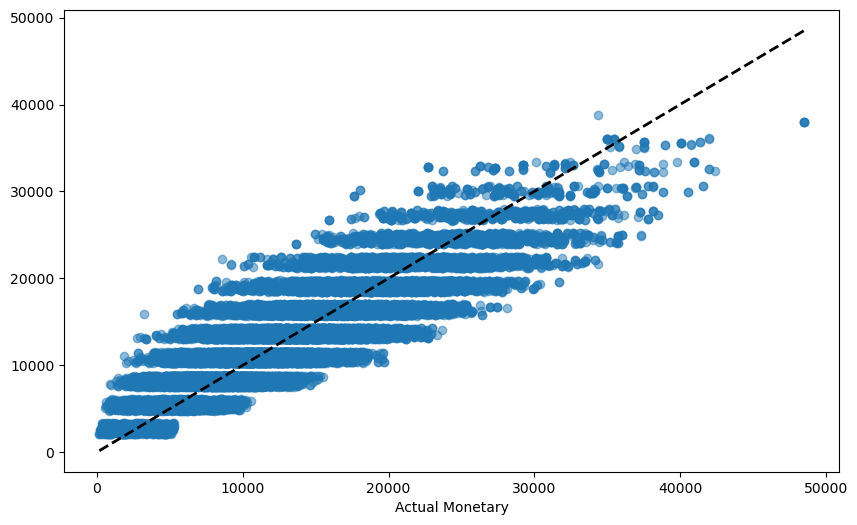

In [142]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel("Actual Monetary")
